In [1]:
import astropy.io as aio
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import astropy_mpl_style
from astropy.visualization import ZScaleInterval, simple_norm, imshow_norm, ZScaleInterval, SinhStretch

import matplotlib.pyplot as plt
import numpy as np

plt.style.use(astropy_mpl_style)

# WISE Data

The used example focuses on showcasing what a moderately dense WISE field, that does not cover area with many previously known moving objects, looks like. 

The goal of the notebook is to showcase potential issues when applying required pre-processing for KBMOD. 

Plot below showcases the response (qauntum efficiency times transmission efficiencies of filters, optics etc.) per photon. The 4 bands are shown in W1 - blue, W2 - green, W3 - orange and W4 in red.              
The notebook focuses on the W1 band, which seems to be the noisiest. W3 and W4 bands would be preffer candidates for TNO searches.

<div>
<img src="https://www.astro.ucla.edu/~wright/WISE/RSR-best-unn.gif" width="600"/>
</div>

Let's open some example files:

In [3]:
# The image file
image_fits = fits.open("data/wise_data_in_general/01221b142-w1-int-1b.fits.gz")

# The Mask file
mask_fits = fits.open("data/wise_data_in_general/01221b142-w1-msk-1b.fits.gz")

# The Uncertainty file
uncert_fits = fits.open("data/wise_data_in_general/01221b142-w1-unc-1b.fits.gz")

## Visualize the images

/home/dino/anaconda3/envs/kbmod/lib/python3.10/site-packages/astropy/visualization/stretch.py:538: RuntimeWarning: overflow encountered in sinh
  np.sinh(values, out=values)


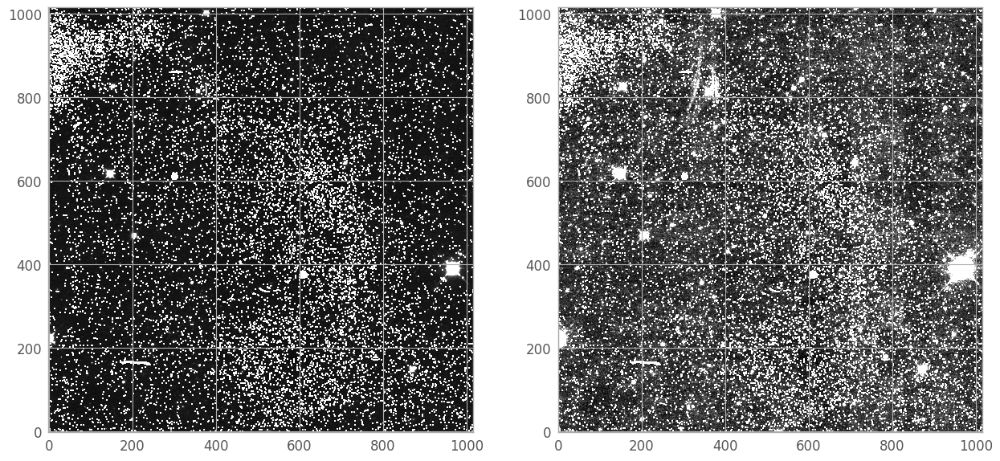

In [4]:
# Display the exact same thing as the above plot
fig, axes = plt.subplots(1, 2, figsize=(15, 15))

norm = simple_norm(image_fits[0].data)
_ = imshow_norm(
    image_fits[0].data, 
    axes[0], 
    cmap="gray", 
    origin='lower',
    interval=ZScaleInterval(contrast=0.15), 
    stretch=SinhStretch()
)
_ = imshow_norm(
    image_fits[0].data, 
    axes[1], 
    cmap="gray", 
    origin='lower',
    interval=ZScaleInterval(contrast=0.95), 
    stretch=SinhStretch()
)

Not great because there seems to be a lot of noise and bad pixels that are obstructing the normalization from showing the data.           
Let's check in on the mask - if it's just a bad pixel/column mask we can use it to clean that up.

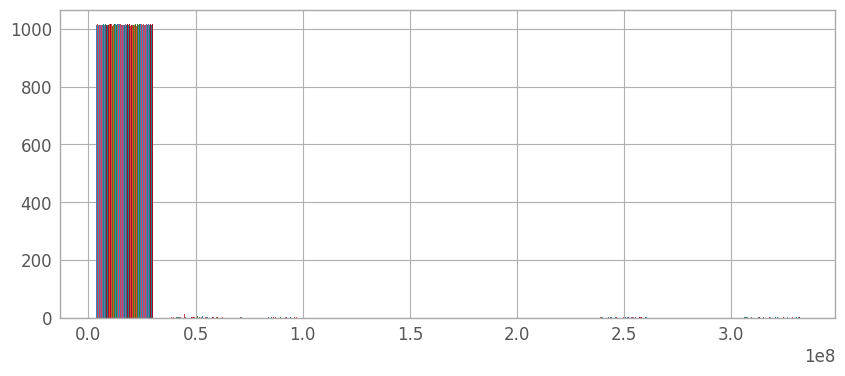

In [4]:
fig, ax = plt.subplots(figsize=(10,4))
_= ax.hist(mask_fits[0].data)

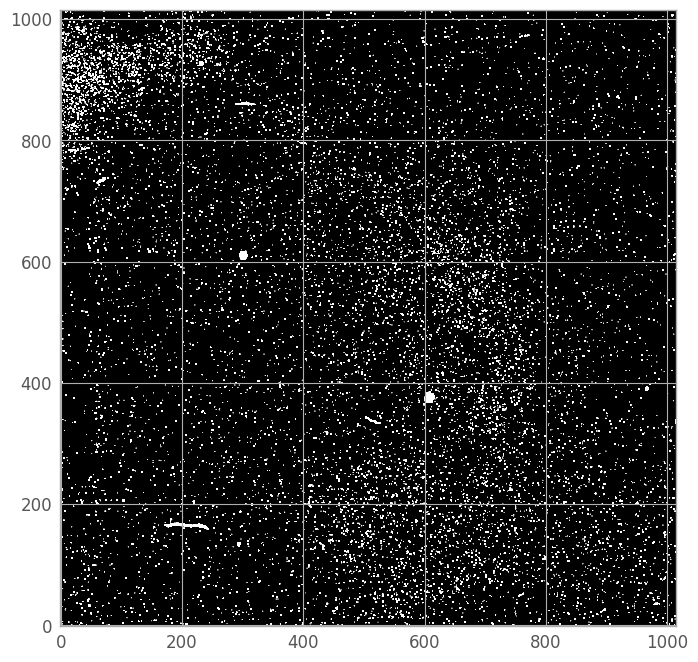

In [5]:
# Display the exact same thing as the above plot
fig, ax = plt.subplots(figsize=(8, 8))

norm = simple_norm(mask_fits[0].data, stretch="asinh", min_cut=0.1, max_cut=1)
_ = ax.imshow(
    mask_fits[0].data, 
    cmap="gray", 
    origin='lower',
    norm=norm
)

Ok, that looks exactly like it contains only a bad pixel information. 

/home/dino/anaconda3/envs/kbmod/lib/python3.10/site-packages/matplotlib/colors.py:719: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


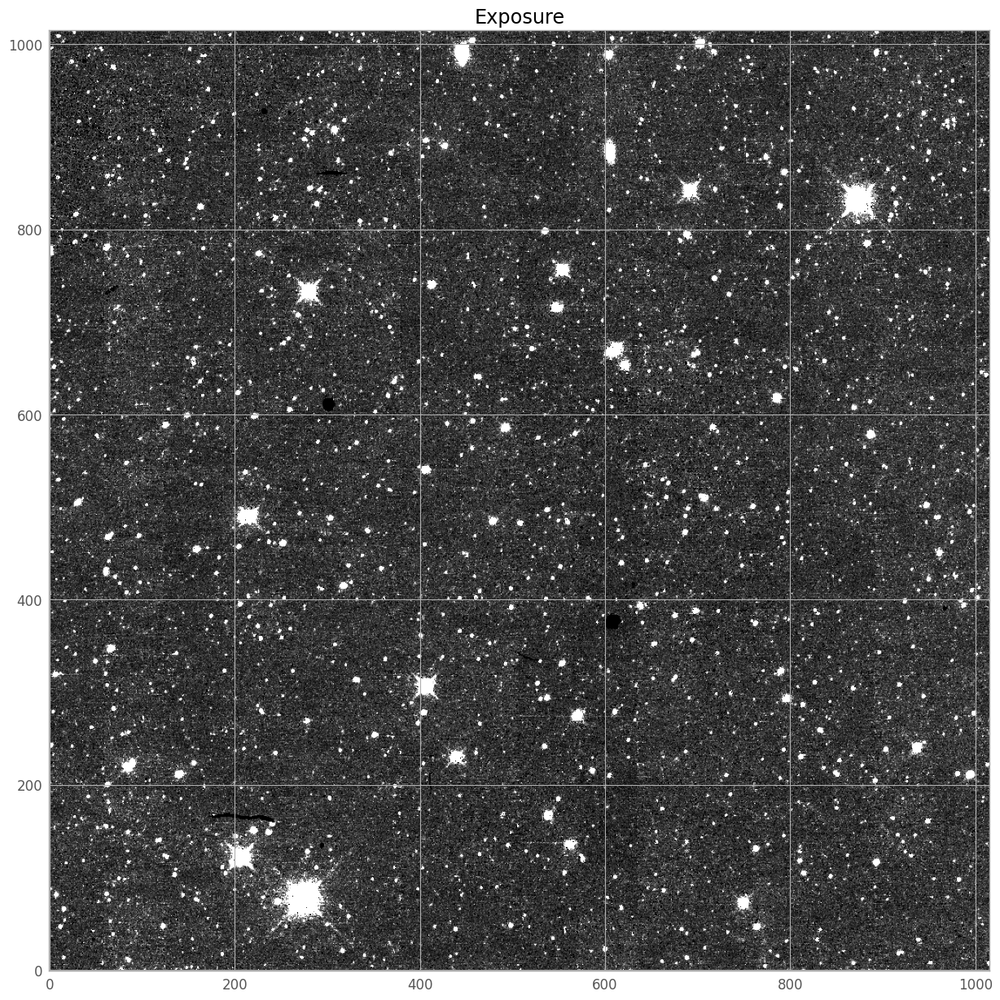

In [54]:
img = image_fits[0].data.copy()
img[mask_fits[0].data>0] = 0

fig, ax = plt.subplots(figsize=(15, 15))
_ = ax.set_title("Exposure")

_ = imshow_norm(
    img, 
    ax, 
    cmap="gray",
    origin='lower',
    interval=ZScaleInterval(contrast=0.5), 
    stretch=SinhStretch()
)

The last bit is the uncertainty image.

We apply the same normalization trick as above to better showcase the data in the image.

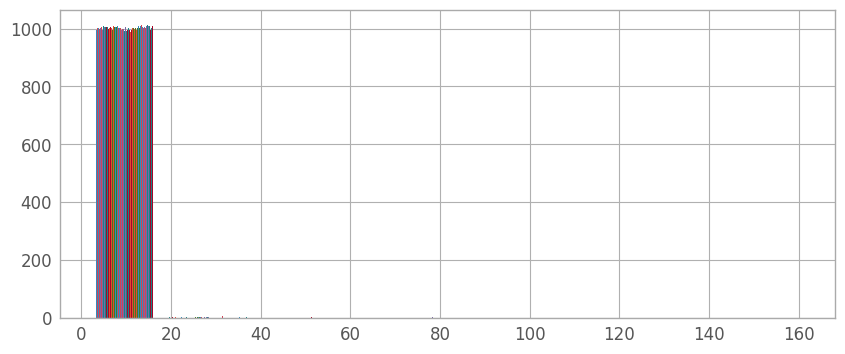

In [55]:
fig, ax = plt.subplots(figsize=(10,4))
_= ax.hist(uncert_fits[0].data)

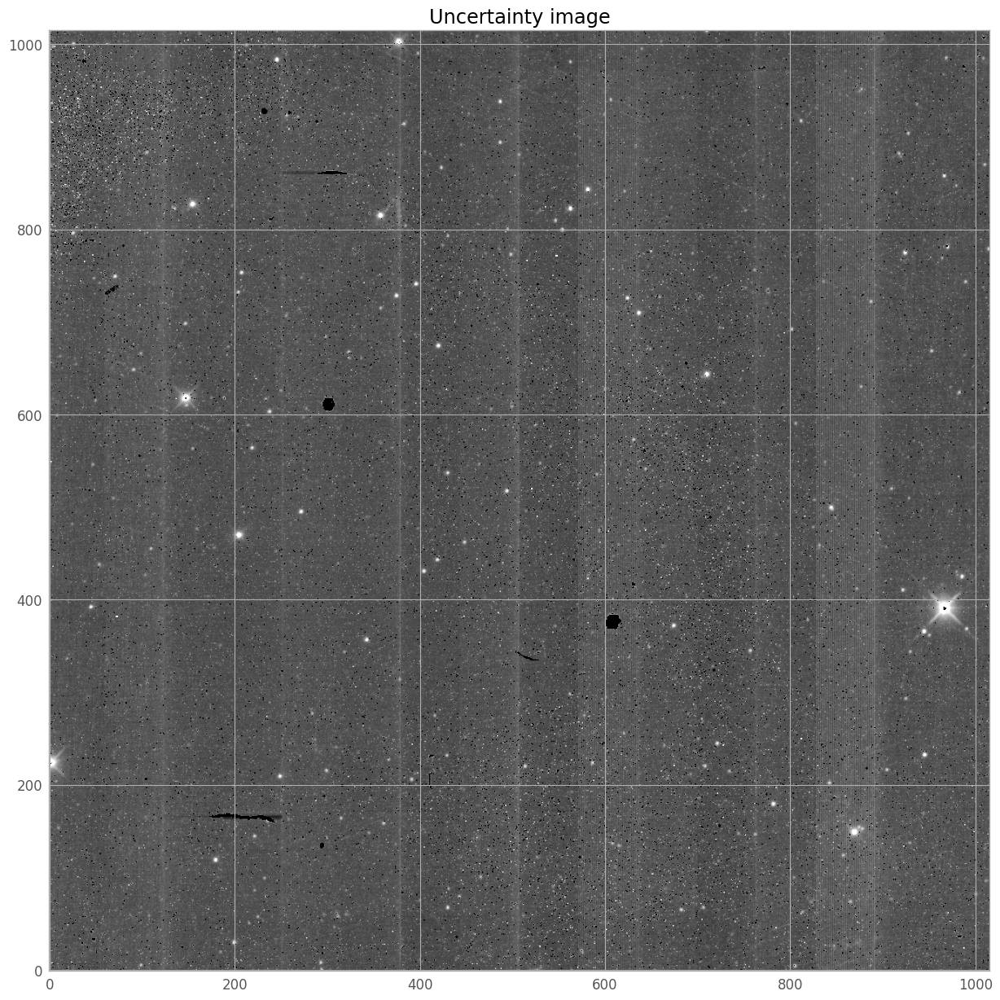

In [56]:
# Display the exact same thing as the above plot
uncert_img = uncert_fits[0].data.copy()
uncert_img[mask_fits[0].data>0] = 0

fig, ax = plt.subplots(figsize=(15, 15))
_ = ax.set_title("Uncertainty image")

norm = simple_norm(uncert_img, stretch="asinh", min_cut=2, max_cut=20)
_ = ax.imshow(
    uncert_img, 
    cmap="gray", 
    origin='lower',
    norm=norm,
)

# Source masking

In [57]:
from astroquery.ipac.irsa import Irsa
Irsa.ROW_LIMIT = 10000

In [58]:
dimx, dimy = image_fits[0].data.shape
center_ra, center_dec = wcs.all_pix2world((dimx/2,), (dimy/2, ), 1, ra_dec_order=True)
img_center = (center_ra[0], center_dec[0])

pix_corners = [
    (0, 0, dimx, dimx), 
    (0, dimy, 0, dimy)
]
corners_ra, corners_dec = wcs.all_pix2world(pix_corners[0], pix_corners[1], 1, ra_dec_order=True)
img_corners = [(r, d) for r, d in zip(corners_ra, corners_dec)]

table = Irsa.query_region(
    img_center, 
    catalog="allwise_p3as_psd", 
    spatial="Polygon",
    selcols="ra,dec,w1mpro",
    polygon = img_corners
)

/home/dino/anaconda3/envs/kbmod/lib/python3.10/site-packages/astroquery/ipac/irsa/core.py:439: UserWarning: Polygon endpoints are being interpreted as RA/Dec pairs specified in decimal degree units.
  warnings.warn("Polygon endpoints are being interpreted as "


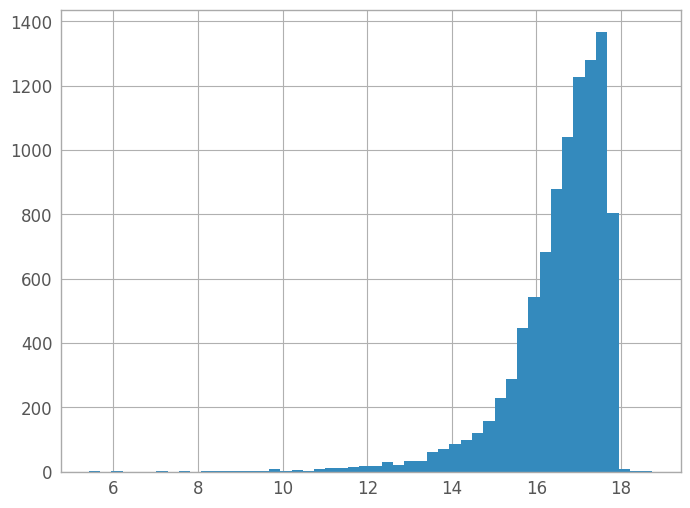

In [59]:
_ = plt.hist(table["w1mpro"], bins=50)

In [60]:
obj_x, obj_y = wcs.all_world2pix(table["ra"], table["dec"], 1)

/home/dino/anaconda3/envs/kbmod/lib/python3.10/site-packages/astropy/visualization/stretch.py:538: RuntimeWarning: overflow encountered in sinh
  np.sinh(values, out=values)
/home/dino/anaconda3/envs/kbmod/lib/python3.10/site-packages/matplotlib/colors.py:719: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


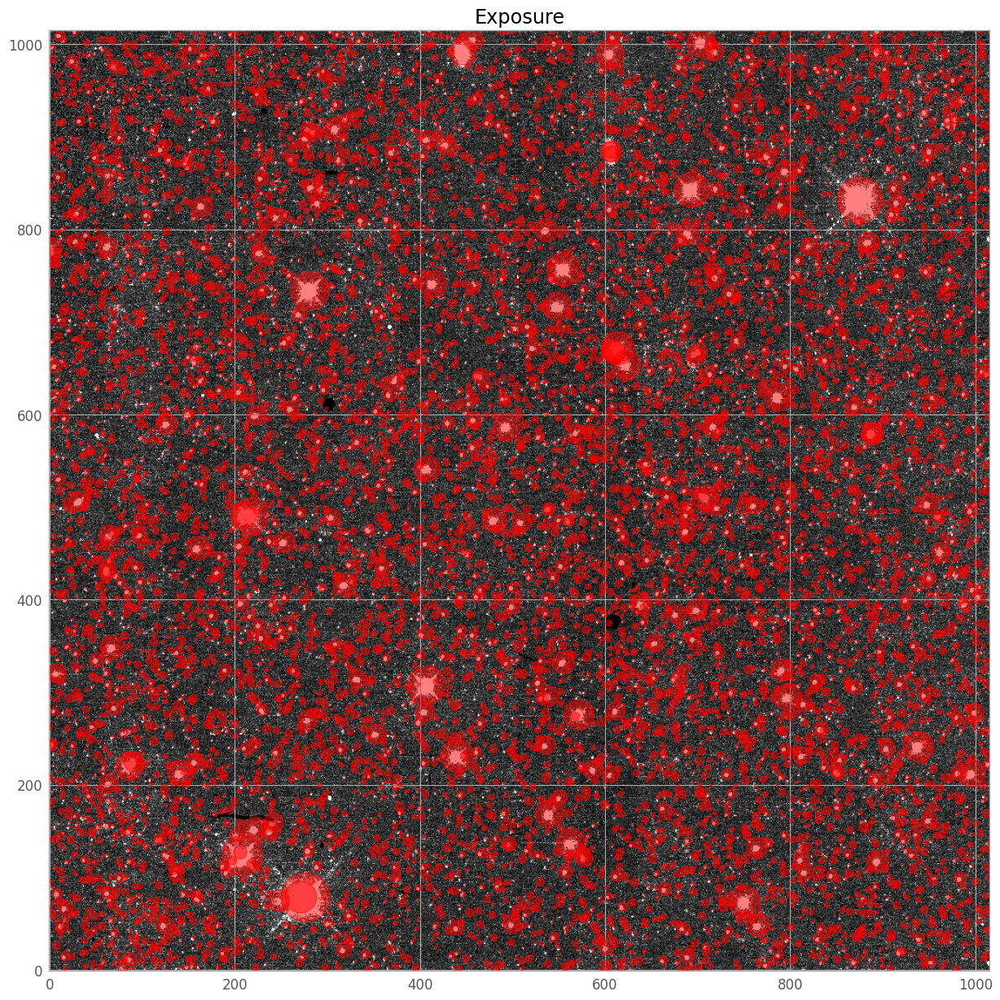

In [61]:
fig, ax = plt.subplots(figsize=(15, 15))
_ = ax.set_title("Exposure")

_ = imshow_norm(
    img, 
    ax, 
    cmap="gray",
    origin='lower',
    interval=ZScaleInterval(contrast=0.5), 
    stretch=SinhStretch()
)

# this is for masked image
img2 = img.copy()
# this is for circular masks in the for loop
Y, X = np.ogrid[:dimy, :dimx]

# this is a made-up linear function that decreases with mag increase
def calc_size(data, a=-2.5, b=40):
    return a*data+b

mask = table["w1mpro"] < 18
size = calc_size(table["w1mpro"][mask])
for x, y, s in zip(obj_x[mask], obj_y[mask], size):
    img2[(X-x)**2 + (Y-y)**2 <= s**2] = 0
    circle = plt.Circle((x, y), s, color="red", alpha=0.5, fill=True)
    ax.add_artist(circle)

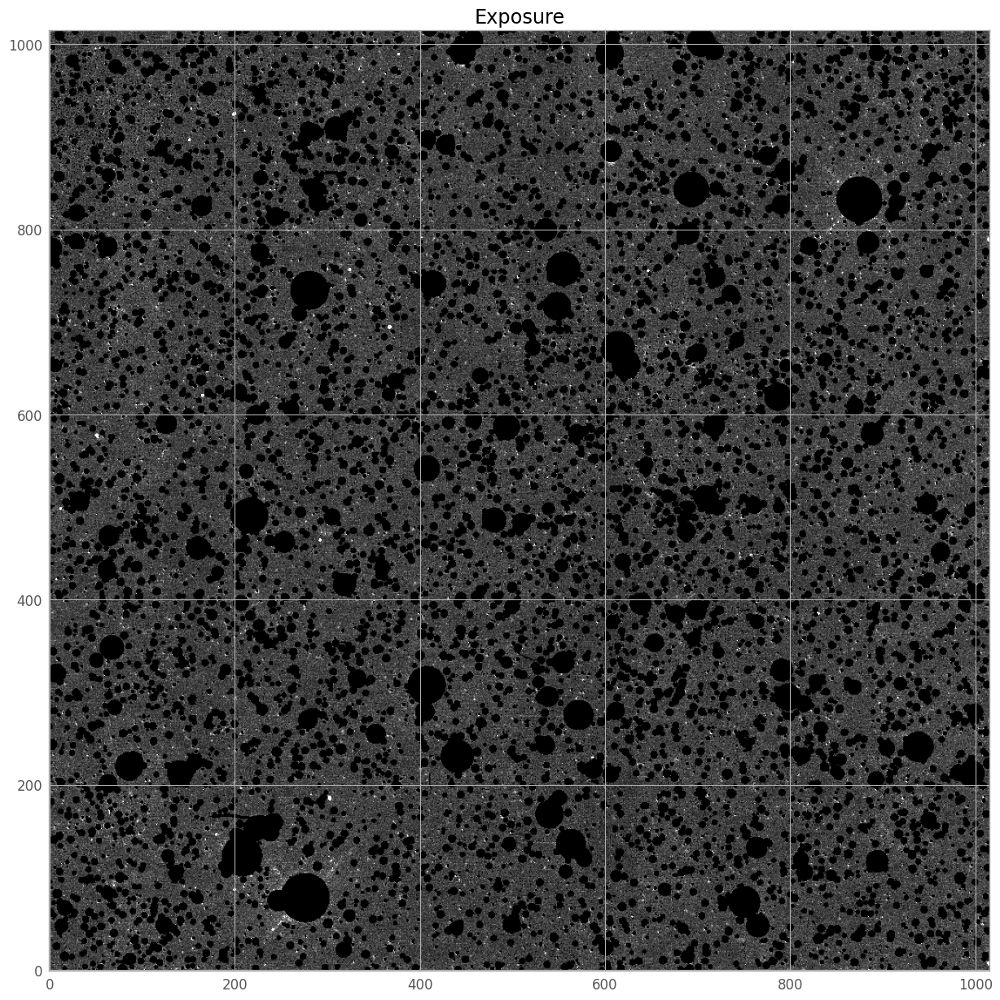

In [62]:
fig, ax = plt.subplots(figsize=(15, 15))
_ = ax.set_title("Exposure")

_ = imshow_norm(
    img2, 
    ax, 
    cmap="gray",
    origin='lower',
    interval=ZScaleInterval(contrast=0.5), 
    stretch=SinhStretch()
)

In [63]:
totnpixels = np.multiply(*img.shape)
nmaskpixels = (mask_fits[0].data > 0).sum()
postmask = (img>0).sum()
postsrcmask = (img2>0).sum()

print(f"There are a total of {totnpixels} pixels in an WISE image.")
print(f"The mask covers {nmaskpixels} pixels on the image,"
      f"or approx {(nmaskpixels/totnpixels) * 100:.2}% of the image.\n"
      f"This leaves {postmask} non-zero pixels in the image.")
print()
print(f"Approximate masking of source objects brighter than 18th magnitude leaves {postsrcmask} nonzero pixels.\n"
      f"This is approximately {(postsrcmask/postmask) * 100:.3}% of science pixels masked.")


There are a total of 1032256 pixels in an WISE image.
The mask covers 12871 pixels on the image,or approx 1.2% of the image.
This leaves 1019278 non-zero pixels in the image.

Approximate masking of source objects brighter than 18th magnitude leaves 739353 nonzero pixels.
This is approximately 72.5% of science pixels masked.
